<h2> Equipo: </h2>

<table>
    <tr>
        <td>Nombre</td>
        <td>Programa Educativo</td>
        <td>Semestre</td>
        <td>Matrícula</td>
    </tr>
    <tr>
        <td>Edna Cruz Flores</td>
        <td>Maestría en Optimización y Cómputo Aplicado</td>
        <td>Tercer semestre</td>
        <td>10034119</td>
    </tr>
    <tr>
        <td>Alejandro Carvantes Barrera</td>
        <td>Maestría en Optimización y Cómputo Aplicado</td>
        <td>Primer semestre</td>
        <td>10036987</td>
    </tr>
    <tr>
        <td>Ollin Villalon Villarreal</td>
        <td>Licenciatura en Ciencias Computacionales</td>
        <td>Tercer semestre</td>
        <td>10032484</td>
    </tr>
</table>

<h3> Link de github: </h3>

<a href="https://github.com/Edna-Cruz-Fl/IA-UAEM/PokemonModels/AventuraPokemon[ECF-MOCA].ipynb"> Edna Cruz Flores || Pokemon Models [AventuraPokemon[ECF-MOCA] </a>

# EDA Pokemon y algo más...

Comparar varios tipos y atributos de Pokémon de las Gens 1 y 2 (ya que estos son los que me gustan...) con algunas imágenes y en el proceso podremos hacer un webscraping para mejorar un poco el conjunto de datos.

In [1]:
# Data manipulation libraries
import numpy as np 
import pandas as pd 

# Data visualisation 
import hiplot as hip
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import plotly
from plotly.subplots import make_subplots
import plotly.graph_objects as go

# Web scraping 
from bs4 import BeautifulSoup, Comment
from requests import get

## Reading the data
pokemon = pd.read_csv('Pokemon.csv')

### Generación de Hiplot

In [2]:
##
pk_hiplot = hip.Experiment.from_csv('Pokemon.csv')
pk_hiplot.display()

<IPython.core.display.Javascript object>


### Datos - Preparación y Limpieza

Algo de exploración básica...


In [3]:
print(pokemon.head())
print(pokemon.info())

   #                   Name Type 1  Type 2  Total  HP  Attack  Defense  \
0  1              Bulbasaur  Grass  Poison    318  45      49       49   
1  2                Ivysaur  Grass  Poison    405  60      62       63   
2  3               Venusaur  Grass  Poison    525  80      82       83   
3  3  VenusaurMega Venusaur  Grass  Poison    625  80     100      123   
4  4             Charmander   Fire     NaN    309  39      52       43   

   Sp. Atk  Sp. Def  Speed  Generation  Legendary  
0       65       65     45           1      False  
1       80       80     60           1      False  
2      100      100     80           1      False  
3      122      120     80           1      False  
4       60       50     65           1      False  
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 800 entries, 0 to 799
Data columns (total 13 columns):
#             800 non-null int64
Name          800 non-null object
Type 1        800 non-null object
Type 2        414 non-null object
Tot

In [4]:
pokemon#["#"]

,#,Name,Type 1,Type 2,Total,HP,Attack,Defense,Sp. Atk,Sp. Def,Speed,Generation,Legendary
0,1,Bulbasaur,Grass,Poison,318,45,49,49,65,65,45,1,False
1,2,Ivysaur,Grass,Poison,405,60,62,63,80,80,60,1,False
2,3,Venusaur,Grass,Poison,525,80,82,83,100,100,80,1,False
3,3,VenusaurMega Venusaur,Grass,Poison,625,80,100,123,122,120,80,1,False
4,4,Charmander,Fire,NaN,309,39,52,43,60,50,65,1,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
795,719,Diancie,Rock,Fairy,600,50,100,150,100,150,50,6,True
796,719,DiancieMega Diancie,Rock,Fairy,700,50,160,110,160,110,110,6,True
797,720,HoopaHoopa Confined,Psychic,Ghost,600,80,110,60,150,130,70,6,True
798,720,HoopaHoopa Unbound,Psychic,Dark,680,80,160,60,170,130,80,6,True


### Conociendo el dataset

In [6]:
## Consulta de los pokemones de tipo 1
print('Pokemon de tipo 1 en el dataset:\n\n',pokemon['Type 1'].unique())

Tipos de pokemon en el dataset:

 ['Grass' 'Fire' 'Water' 'Bug' 'Normal' 'Poison' 'Electric' 'Ground'
 'Fairy' 'Fighting' 'Psychic' 'Rock' 'Ghost' 'Ice' 'Dragon' 'Dark' 'Steel'
 'Flying']


In [8]:
##Consulta de los pokemones de tipo 2
print('Pokemon de tipo 2 en el dataset:\n\n',pokemon['Type 2'].unique())
print('\nExisten datos faltantes!! (nan)')

Pokemon de tipo 2 en el dataset:

 ['Poison' nan 'Flying' 'Dragon' 'Ground' 'Fairy' 'Grass' 'Fighting'
 'Psychic' 'Steel' 'Ice' 'Rock' 'Dark' 'Water' 'Electric' 'Fire' 'Ghost'
 'Bug' 'Normal']

Existen datos faltantes!! (nan)


In [9]:
##Consulta del número total de generaciones
print('Generaciones de pokemon en dataset:\n\n',pokemon['Generation'].unique())

Generaciones de pokemon en dataset:

 [1 2 3 4 5 6]


In [10]:
## Consulta de los datos para los pokemon de generación 1, 2 3 y 4
pokemon[pokemon.Generation.isin([1,2,3, 4])]

,#,Name,Type 1,Type 2,Total,HP,Attack,Defense,Sp. Atk,Sp. Def,Speed,Generation,Legendary
0,1,Bulbasaur,Grass,Poison,318,45,49,49,65,65,45,1,False
1,2,Ivysaur,Grass,Poison,405,60,62,63,80,80,60,1,False
2,3,Venusaur,Grass,Poison,525,80,82,83,100,100,80,1,False
3,3,VenusaurMega Venusaur,Grass,Poison,625,80,100,123,122,120,80,1,False
4,4,Charmander,Fire,NaN,309,39,52,43,60,50,65,1,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
548,490,Manaphy,Water,NaN,600,100,100,100,100,100,100,4,False
549,491,Darkrai,Dark,NaN,600,70,90,90,135,90,125,4,True
550,492,ShayminLand Forme,Grass,NaN,600,100,100,100,100,100,100,4,True
551,492,ShayminSky Forme,Grass,Flying,600,100,103,75,120,75,127,4,True


### Limpieza de los datos de las generaciones seleccionadas

In [ ]:
# Desechar columna #
pokemon.drop(['#'], axis = 'columns', inplace = True)

In [11]:
# Sólo trabajaremos con la generación 3 y 4 .... vean que en este dataset hay hasta la 6ta gen...
my_pokemon = pokemon[pokemon.Generation.isin([3, 4])].copy()
my_pokemon.Generation.unique()
my_pokemon.shape

(281, 13)

In [12]:
print('There are ',my_pokemon.duplicated('Name').sum(), 'duplicated names in the dataset, so it must be something else\n')
print(my_pokemon.loc[(my_pokemon.Generation == 3) & (my_pokemon.Legendary == True), 'Name'],  '''\nAha! We didn't have MEGA stuff back in my day. Let's exclude those\n''')

There are  0 duplicated names in the dataset, so it must be something else

414                 Regirock
415                   Regice
416                Registeel
417                   Latias
418        LatiasMega Latias
419                   Latios
420        LatiosMega Latios
421                   Kyogre
422      KyogrePrimal Kyogre
423                  Groudon
424    GroudonPrimal Groudon
425                 Rayquaza
426    RayquazaMega Rayquaza
427                  Jirachi
428       DeoxysNormal Forme
429       DeoxysAttack Forme
430      DeoxysDefense Forme
431        DeoxysSpeed Forme
Name: Name, dtype: object 
Aha! We didn't have MEGA stuff back in my day. Let's exclude those



In [13]:
mega_filter = (my_pokemon.Name.str.contains('Mega ')) #Put a space there to exclude meganium which is a legit second generation pokemon
my_pokemon = my_pokemon[~mega_filter]
print(my_pokemon.groupby('Generation').size(),  '\nOk now everything matches my expectations!')

Generation
3    140
4    116
dtype: int64 
Ok now everything matches my expectations!


¡Bien! ¡Tenemos los 256 Pokémon ahora como esperábamos! Intentemos explorar un poco los atributos para ver en términos generales cómo se relacionan entre sí.

### Atributos de Pokémon y cómo se relacionan entre sí

Como tenemos 251 Pokémon y 6 atributos para cada uno de ellos, pensé que haría un desglose de cómo se relacionan entre sí.
¿Los Pokémon con mayor defensa también tienen un mayor ataque? ¿Los Pokémon rápidos también son buenos defensivamente?
Con ese fin, usaremos un par de cuadrículas de Seaborn. Es una cuadrícula bastante personalizable donde puede mapear diferentes tipos de parcelas en el triángulo superior, triángulo inferior y ejes diagonales.
La figura producida tiene tres tramas:

    Triángulo superior -> Diagrama de dispersión para cada pokemon con naranja que indica pokemon legendario (diagrama de dispersión de Seaborn)
    Diagonal -> Gráfico de densidad de kernel para cada atributo (Seabon kdplot)
    Triángulo inferior -> Gráfico de dispersión con un ajuste de modelo de regresión lineal (gráfico de reglaje de Seaborn)

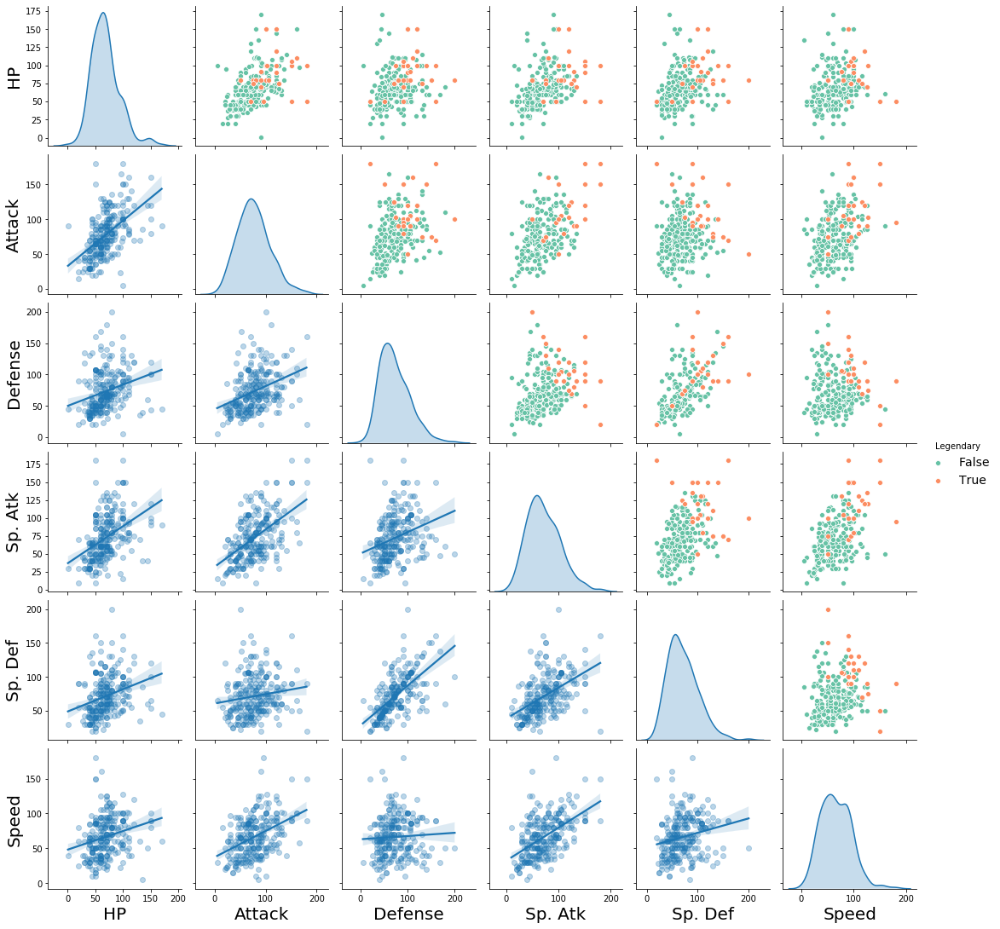

In [14]:
def my_pairgrid(input_df):
    mpl.rcParams["axes.labelsize"] = 20 #Increases the axis titles and the legend size
    g = sns.PairGrid(input_df, vars=['HP', 'Attack', 'Defense', 'Sp. Atk', 'Sp. Def', 'Speed'])
    g = g.map_diag(sns.kdeplot, shade=True)
    g = g.map_lower(sns.regplot, scatter_kws={'alpha':0.3})
    g.hue_vals = input_df["Legendary"]
    g.hue_names = input_df["Legendary"].unique()
    g.palette = sns.color_palette("Set2", len(g.hue_names))
    g = g.map_upper(sns.scatterplot).add_legend(title='Legendary', fontsize= 14)
    return(g)
_ = my_pairgrid(my_pokemon)

In [15]:
print('Cantidad de pokemons legendarios en la generación 3 y 4\n',my_pokemon[my_pokemon['Legendary'] == True].count())

Cantidad de pokemons legendarios en la generación 3 y 4
 #             28
Name          28
Type 1        28
Type 2        11
Total         28
HP            28
Attack        28
Defense       28
Sp. Atk       28
Sp. Def       28
Speed         28
Generation    28
Legendary     28
dtype: int64


**Análisis del espectro**

*Los pokemon legendarios se siguen concentrando en el extremo superior del 
espectro en la mayoría de los atributos.*

*Existe un mayor rango de distribución en las diferentes variables**


### Correlación entre atributos

Si bien el primer gráfico fue útil, quizás una mejor manera de visualizar la correlación entre atributos es un mapa de calor con un azul más fuerte que indica una correlación más alta.

In [16]:
my_pokemon

,#,Name,Type 1,Type 2,Total,HP,Attack,Defense,Sp. Atk,Sp. Def,Speed,Generation,Legendary
272,252,Treecko,Grass,NaN,310,40,45,35,65,55,70,3,False
273,253,Grovyle,Grass,NaN,405,50,65,45,85,65,95,3,False
274,254,Sceptile,Grass,NaN,530,70,85,65,105,85,120,3,False
276,255,Torchic,Fire,NaN,310,45,60,40,70,50,45,3,False
277,256,Combusken,Fire,Fighting,405,60,85,60,85,60,55,3,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
548,490,Manaphy,Water,NaN,600,100,100,100,100,100,100,4,False
549,491,Darkrai,Dark,NaN,600,70,90,90,135,90,125,4,True
550,492,ShayminLand Forme,Grass,NaN,600,100,100,100,100,100,100,4,True
551,492,ShayminSky Forme,Grass,Flying,600,100,103,75,120,75,127,4,True


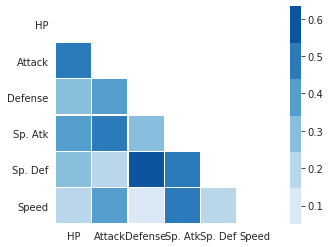

In [17]:
my_corr = my_pokemon.loc[:, 'HP':'Speed'].corr() 
mask = np.zeros_like(my_corr) 
mask[np.triu_indices_from(mask)] = True ## This part is to blank out the upper diagonal
with sns.axes_style("white"):
     ax = sns.heatmap(my_corr, mask=mask, square=True, cmap=sns.color_palette("Blues"), vmax=np.max(np.sort(my_corr.values)[:,-2]), linewidths=0.3)

# Análisis de atributos por pokemon y tipo

Hagamos un análisis de cómo los atributos varían con el tipo.
Mi primera idea fue usar un Seaborn Swarmplot ya que no tenemos tantos datos que estarán superpoblados.


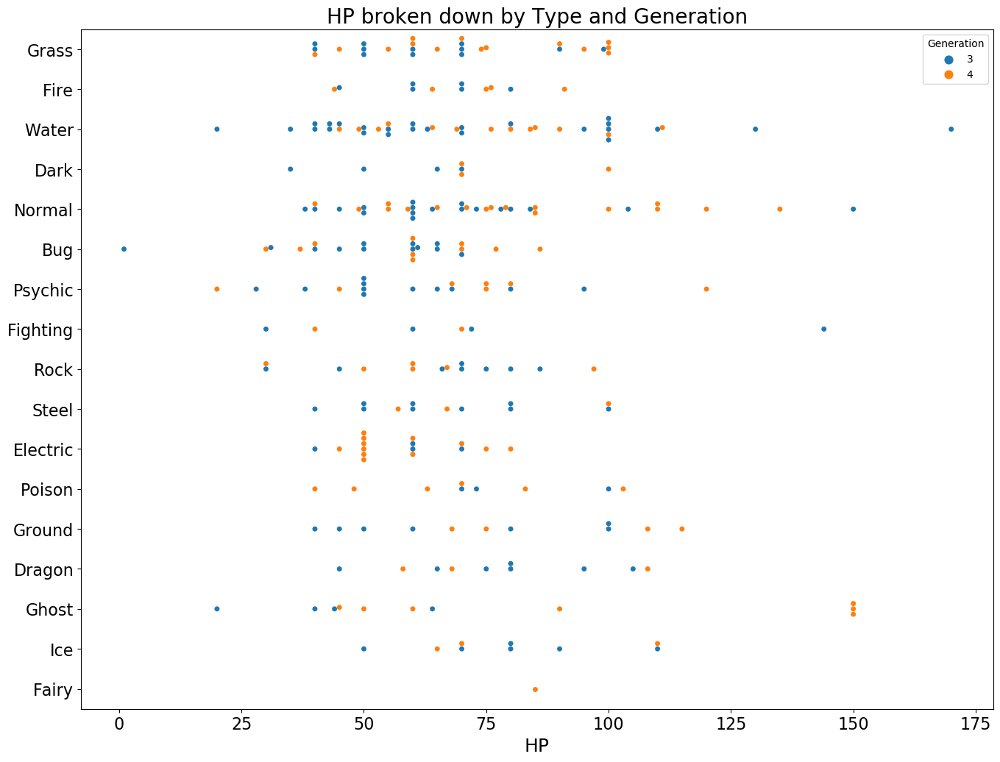

In [18]:
sns.reset_defaults()
plt.figure(figsize=(16,12))
g = sns.swarmplot(x='HP', y='Type 1', hue = 'Generation', data=my_pokemon)
g.yaxis.label.set_visible(False)
g.set_title('HP broken down by Type and Generation')
#_ = g.annotate('These are Chansey and Blissey', xy=(253, 3.5), xytext = (250, 2), fontsize = 12, arrowprops=dict(facecolor='black') )
#_ = g.annotate('Wooooobbufet', xy=(190, 9.5), xytext = (191, 8.5), fontsize = 12, arrowprops=dict(facecolor='green'))
g.title.set_fontsize(20)
g.xaxis.label.set_fontsize(18)
g.tick_params(axis='x', labelsize=16)
g.tick_params(axis='y', labelsize=16)

In [23]:
def attr_per_type(input_df, y_attr, hue_attr):
    mpl.rcParams["font.size"] = 18
    f, axes = plt.subplots(2, 3, figsize=(20, 20), sharey=True, sharex=True)
    #f.tight_layout()
    poke_attributes = ['HP', 'Defense', 'Sp. Def', 'Speed', 'Attack', 'Sp. Atk']
    counter = 0
    #axes[0,1].tick_params(labelleft=False)
    for row in range(2):
        for col in range(3):
            sns.boxplot(y = y_attr, x = poke_attributes[counter], data=input_df, ax=axes[row, col], showfliers=False)
            sns.swarmplot(y = y_attr, x = poke_attributes[counter], data=input_df, ax=axes[row, col], hue = hue_attr, palette=['black', 'orange'])
            axes[row, col].set_title(axes[row, col].get_xlabel())
            axes[row, col].xaxis.label.set_visible(False)
            axes[row, col].get_legend().remove()
            counter += 1
            if (col == 0):
                axes[row, col].yaxis.label.set_visible(False)
                continue
            axes[row, col].yaxis.set_visible(False)
    return(f, axes)


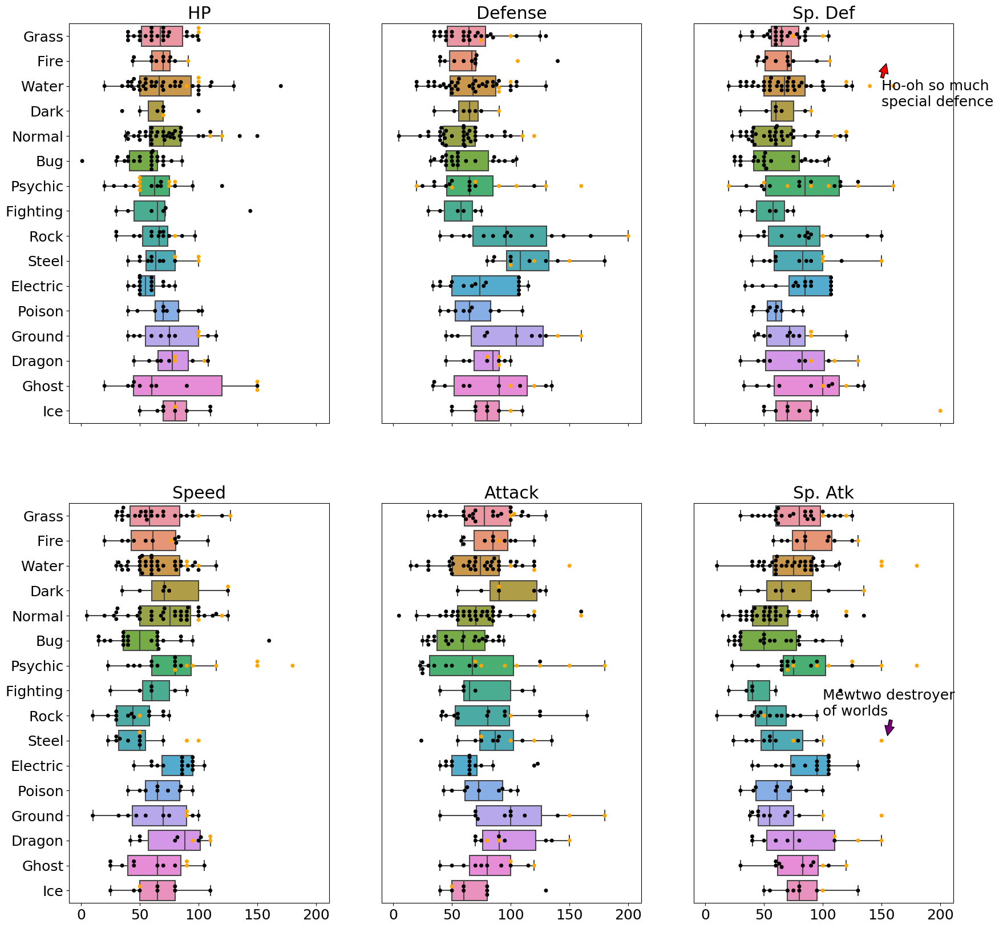

In [25]:
(f, axes) = attr_per_type(my_pokemon, 'Type 1', 'Legendary')
_ = axes[0, 1].annotate('Shuckle the defense \nmonster', xy=(230, 3.2), xytext = (140, 5), arrowprops=dict(facecolor='blue'))
_ = axes[0, 2].annotate('Ho-oh so much \nspecial defence', xy=(154, 1.1), xytext=(150, 2.8), arrowprops=dict(facecolor='red'))
_ = axes[1, 2].annotate('Mewtwo destroyer \nof worlds', xy=(155, 8.8), xytext= (100, 8), arrowprops=dict(facecolor='purple'))

*Muy bien, esto se ve mucho mejor! El problema con el conjunto de datos actual es que incluye Pokémon de menor evolución. Por ejemplo, Charmander, Charmeleon y Charizard están todos incluidos. Preferiría que solo se incluyera el último Pokémon de evolución porque la selección se realiza principalmente en función de esos. Tratemos de solucionar este problema raspando el árbol de evolución de Pokémon del sitio web de pokemondb.*

Voy a desglosar cada paso para que sea más comprensible.
---

### Web scraping para mejorar nuestro conjunto de datos

**Paso 1: encontrar la URL**

El sitio web que elegí es el sitio web de pokemondb que enumera las evoluciones de todos los Pokémon en esta forma:

![img](Figures/282GardevoirGen3.png)


In [26]:
poke_url = 'https://pokemondb.net/evolution#evo-g3'
response = get(poke_url) 
html_soup = BeautifulSoup(response.text, 'html.parser') ## Getting the html into python

**Paso 2: examinar el HTML de la página y extraer los datos**

Ahora que tenemos el HTML, tenemos que examinar dónde se encuentra exactamente la información que queremos. Podemos utilizar las herramientas de desarrollo de Google Chrome para ver qué parte del árbol HTML nos interesa.

![img](Figures/RaltsGen3.png)


In [27]:
infocard = html_soup.find_all('div', {'class' : 'infocard-list-evo'})

**Paso 3: localizar y extraer toda la información útil en el HTML**

Ahora que hemos seleccionado todos los divs, necesitamos extraer la información que nos sea útil. Me gustaría obtener la siguiente información:

    La evolución es el pokemon (1º, 2º, etc.)
    El número de Pokémon (lo necesitaremos en el futuro para filtrar)
    El texto pequeño debajo del pokemon (nuevamente, esto se usará para filtrar)
    El nombre de pokemon

Toda la información que queremos se puede encontrar en el intervalo con la clase 'infocard-lg-data text-muted' como se puede ver en la captura de pantalla a continuación:

![img](Figures/282GardevoirGen3.png)

<span class="infocard-lg-data text-muted"><small>#282</small><br> <a class="ent-name" href="/pokedex/gardevoir">Gardevoir</a><br> <small><a href="/type/psychic" class="itype psychic">Psychic</a> · <a href="/type/fairy" class="itype fairy">Fairy</a></small></span>


infocard-lg-data text-muted

Solo necesitamos extraer el primer pequeño (número de pokemon), el segundo pequeño (nombre de pokemon) y la etiqueta a con la clase 'ent-name' que tiene el texto pequeño debajo del pokemon.

También utilizo enumerate para crear un índice de la evolución del pokemon. Entonces, por ejemplo, en los casos simples (Charmander -> Charmeleon -> Charizard) con enumerate logro darle a Charmander el número 1, Charmeleon el número 2 y Charizard el número 3.

Desafortunadamente, esto falla estrepitosamente para los casos complejos (como el de Pikatchu) pero trataremos esto en un paso posterior.

In [28]:
raw = []
for chain in infocard:
    raw.append(([(i, x.find('small').getText(), x.find_all('small')[1].getText(), x.find('a', {'class':'ent-name'}).getText(), ) for i, x in enumerate(list(chain.find_all('span', {'class':'infocard-lg-data text-muted'})), 1)]))

raw[-4:-1] ## Our list contains touple lists with the evolution branch of each pokemon. We keep that in mind for our future processing

[[(1, '#885', 'Dragon · Ghost', 'Dreepy'),
  (2, '#886', 'Dragon · Ghost', 'Drakloak'),
  (3, '#887', 'Dragon · Ghost', 'Dragapult')],
 [(1, '#891', 'Fighting', 'Kubfu'),
  (2, '#892', 'Single Strike Style', 'Urshifu'),
  (3, '#892', 'Rapid Strike Style', 'Urshifu')],
 [(1, '#892', 'Single Strike Style', 'Urshifu')]]

In [29]:
raw

[[(1, '#001', 'Grass · Poison', 'Bulbasaur'),
  (2, '#002', 'Grass · Poison', 'Ivysaur'),
  (3, '#003', 'Grass · Poison', 'Venusaur')],
 [(1, '#004', 'Fire', 'Charmander'),
  (2, '#005', 'Fire', 'Charmeleon'),
  (3, '#006', 'Fire · Flying', 'Charizard')],
 [(1, '#007', 'Water', 'Squirtle'),
  (2, '#008', 'Water', 'Wartortle'),
  (3, '#009', 'Water', 'Blastoise')],
 [(1, '#010', 'Bug', 'Caterpie'),
  (2, '#011', 'Bug', 'Metapod'),
  (3, '#012', 'Bug · Flying', 'Butterfree')],
 [(1, '#013', 'Bug · Poison', 'Weedle'),
  (2, '#014', 'Bug · Poison', 'Kakuna'),
  (3, '#015', 'Bug · Poison', 'Beedrill')],
 [(1, '#016', 'Normal · Flying', 'Pidgey'),
  (2, '#017', 'Normal · Flying', 'Pidgeotto'),
  (3, '#018', 'Normal · Flying', 'Pidgeot')],
 [(1, '#019', 'Normal', 'Rattata'), (2, '#020', 'Normal', 'Raticate')],
 [(1, '#019', 'Alolan Rattata', 'Rattata'),
  (2, '#020', 'Alolan Raticate', 'Raticate')],
 [(1, '#021', 'Normal · Flying', 'Spearow'),
  (2, '#022', 'Normal · Flying', 'Fearow')],
 [(1

**Paso 4: limpieza del conjunto de datos**

Ahora que hemos extraído los datos, definitivamente necesitamos hacer algunos filtros:

    Eliminar todos los Pokémon que tienen 'alolan' en su nombre, ya que son de generaciones más nuevas, supongo.
    Elimina todos los Pokémon con un número superior a 251, ya que estos son nuevamente de generaciones más nuevas.
    Elimine todas las entradas restantes que tengan 1 o menos entradas de la lista

In [31]:
#And what better way to do all this than list comprehensions! 
step_1 = [[elem for elem in branch_list if 'Alol' not in elem[2]] for branch_list in raw] ## Remove all touples that contain 'Alol' in the small text (removing the second Raichu in our example)
step_2 = [[elem for elem in branch_list if int(elem[1][1:]) <= 493] for branch_list in step_1] ## Remove all pokemon that are after Gen 2 (Number > 251) 
step_3 = [elem for elem in step_2 if len(elem) > 1] ##Remove entries that have a length of 1 or less (remove leftovers that are not actual branches in Gens 1 & 2)

**Paso 5: mejorar nuestro conjunto de datos existente**

Para el análisis me gustaría poder decir qué Pokémon son la última evolución de cada rama y qué Pokémon no tienen evolución (y por lo tanto no se incluyeron en la lista en absoluto). Por ejemplo: Charmander es el primero en el árbol de evolución Charmander-Charmeleon-Charizard y me gustaría excluirlo del análisis. Snorlax por otro lado no tiene evolución y me gustaría incluirlo en el análisis.

Por tanto, me gustaría crear 2 listas, una con todos los pokémon que pertenecen a una rama de evolución y otra con pokémon que son los últimos de una rama de evolución.



In [32]:
has_evolution = [[elem[3] for elem in branch_list] for branch_list in step_3] ## Extract all pokemon that in the raw list
has_evolution = sum(has_evolution, []) ## 'Un-tupple' them -- This is not the optimal way to do this but I find it really really cool and for such a small list it doesn't matter

In [33]:
last_evolutions  = [x[-1] for x in step_3] ## Take the last entry into each element list
last_evolutions.extend([x[-2] for x in step_3 if x[-1][0] == 4]) # The ones that have 2 end evolutions like Politoed and Poliwrath

## This is the eevee and hitmontop section as they have 5 and 3 final evolutions respecitvely
eevee_and_hitmon = [x[1:] for x in step_3 if (x[0][3] == 'Tyrogue') 
                    or (x[0][3] ==  'Eevee') 
                    or (x[0][3] ==  'Wurmple') 
                    or (x[0][3] ==  'Ralts') 
                    or (x[0][3] ==  'Nincada') 
                    or (x[0][3] ==  'Snorunt') 
                    or (x[0][3] ==  'Clamperl')
                    or (x[0][3] ==  'Burmy')
                   ]
eevee_and_hitmon = sum(eevee_and_hitmon, [])
last_evolutions.extend(eevee_and_hitmon)

last_evo_df = pd.DataFrame([[int(x[1][1:]), x[3]] for x in last_evolutions], columns=['Number', 'Pokemon'] )
last_evo_df = last_evo_df.drop_duplicates() ## Remove duplicates because some hitmontop and eevee evolutions have been added more than once in the process

Estamos al final del proceso, tenemos una lista de Pokémon que pertenecen a una rama de evolución y también tenemos una lista de Pokémon que son las últimas evoluciones. Sigamos adelante y actualicemos nuestro conjunto de datos inicial

In [34]:
my_pokemon['Has_evol'] = my_pokemon.Name.isin(has_evolution)
my_pokemon['Last_evol'] = my_pokemon.Name.isin(last_evo_df.Pokemon)
my_evolved_pokemon = my_pokemon.loc[(my_pokemon.Last_evol == True) | (my_pokemon.Has_evol == False)].copy()

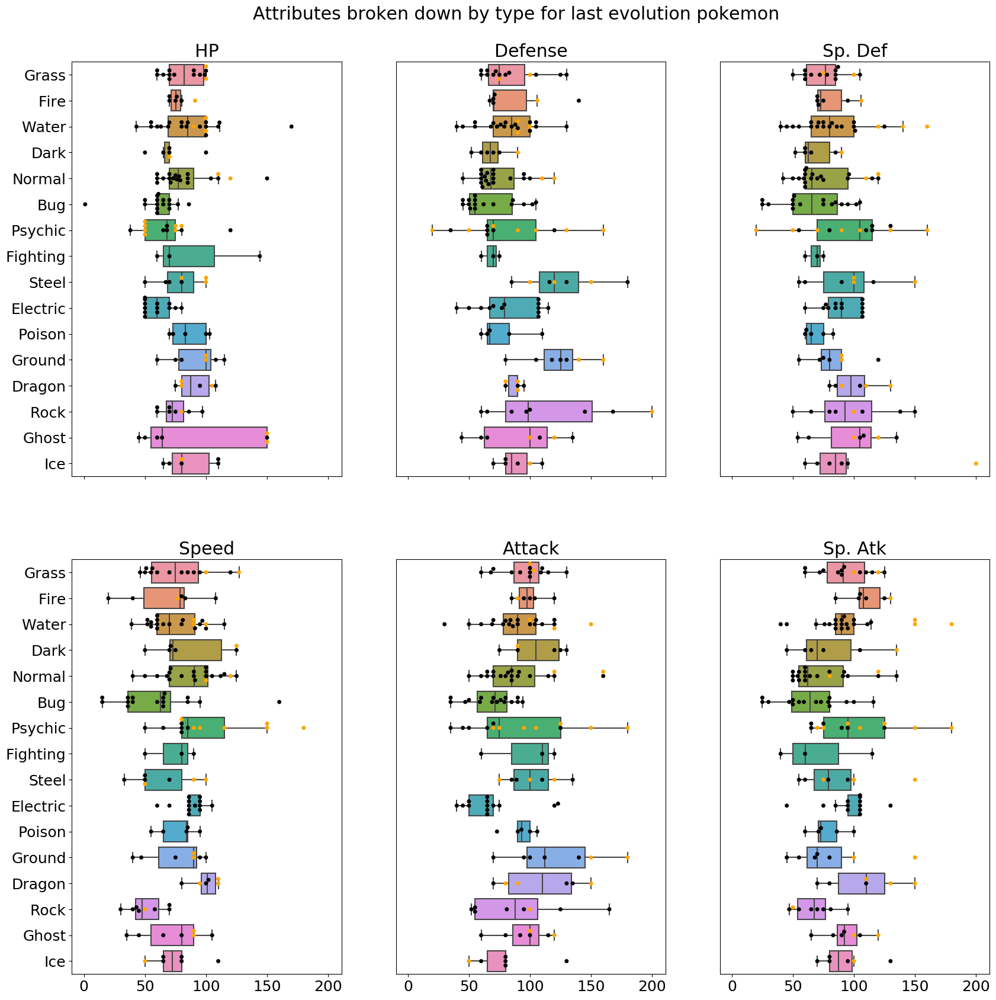

In [35]:
(f, axes) = attr_per_type(my_evolved_pokemon, 'Type 1', 'Legendary')
_ = f.suptitle('Attributes broken down by type for last evolution pokemon', va='center', y=0.92)

Estos son los Pokémon reales que podrían usarse en una batalla de Pokémon, ya que tener una evolución significa que tus estadísticas aumentarán y tendrás acceso a un grupo de movimientos más amplio.

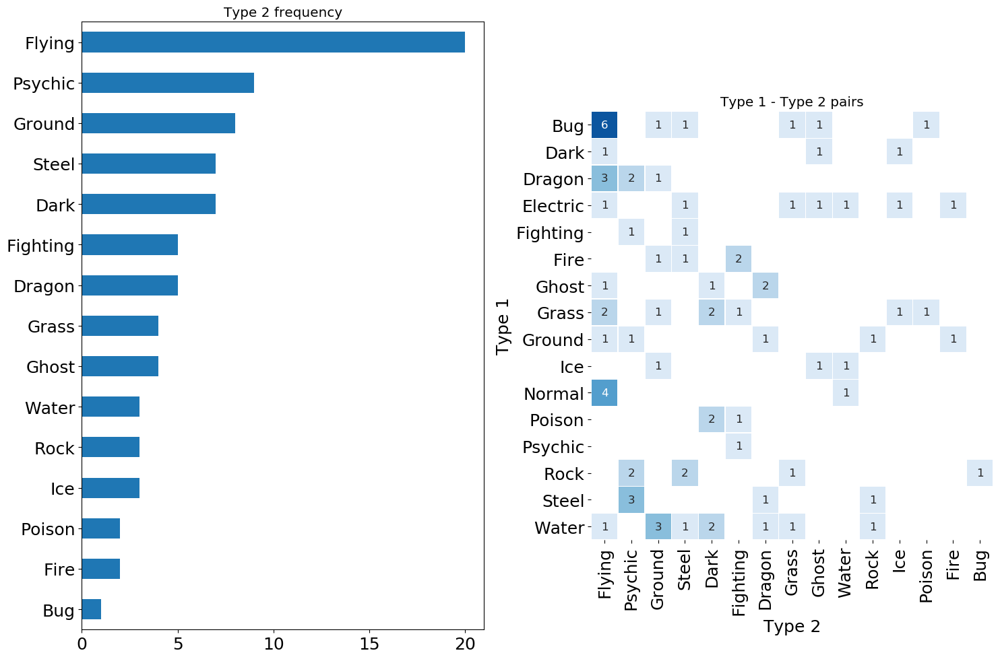

In [36]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 10))
mpl.rcParams["font.size"] = 12

ax1 = my_evolved_pokemon.groupby('Type 2').size().sort_values().plot(kind='barh', ax=ax1)
start, end = ax1.get_xlim()
ax1.xaxis.set_ticks(np.arange(start, end, 5))
ax1.axes.get_yaxis().get_label().set_visible(False)
_ = ax1.set_title('Type 2 frequency')

pivot_dat = my_evolved_pokemon.pivot_table(index='Type 1', columns='Type 2', aggfunc = 'size')
pivot_dat = pivot_dat[pivot_dat.sum().sort_values(ascending = False).index] #Reordering
ax2 = sns.heatmap(pivot_dat, annot=True, square=True, cmap=sns.color_palette("Blues"), cbar=False, linewidths=0.3, ax=ax2)
_ = ax2.set_title('Type 1 - Type 2 pairs')
fig.tight_layout()

In [37]:
my_evolved_pokemon['New type'] = my_evolved_pokemon['Type 1']
my_evolved_pokemon['Dual type'] = ~pd.isnull(my_pokemon['Type 2'])
dual_evolved_pokemon = my_evolved_pokemon.append(my_evolved_pokemon[my_evolved_pokemon['Dual type']==True], ignore_index=True)

#Change the second instance of the pokemon to have the second type
dual_evolved_pokemon.loc[dual_evolved_pokemon.duplicated(), 'New type'] = dual_evolved_pokemon.loc[dual_evolved_pokemon.duplicated(), 'Type 2'] 

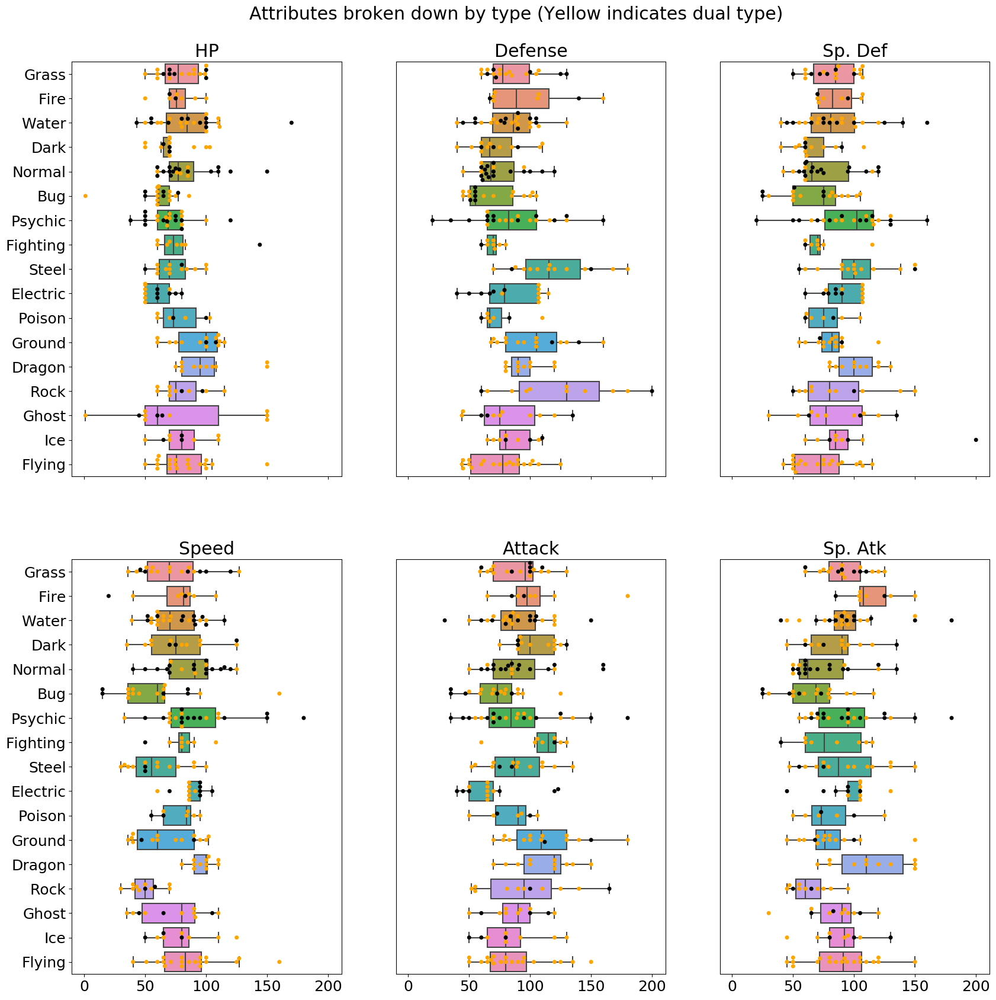

In [38]:
(f, axes) = attr_per_type(dual_evolved_pokemon, 'New type', 'Dual type')
_ = f.suptitle("Attributes broken down by type (Yellow indicates dual type)", va='center', y=0.92)

In [39]:
def create_radar_chart(input_df, group_col, col_num):
    poke_stats = input_df.loc[:, 'HP':'Speed']
    norm_poke_stats = poke_stats / poke_stats.max() #Let's normalise the data 
    radar_dat = pd.concat([norm_poke_stats, input_df.loc[:, [group_col, 'Name']]], axis=1)
    radar_dat_short = radar_dat.groupby([group_col]).mean().loc[:,['HP', 'Defense', 'Sp. Def', 'Speed', 'Sp. Atk', 'Attack']]
    radar_dat_short.columns = ['HP', 'Def', 'Sp. Def', 'Speed', 'Sp. Atk', 'Atk']

    fig = make_subplots(rows=4, cols=col_num, vertical_spacing = 0.08, horizontal_spacing=0.04, specs=[[{"type": "polar"}]*col_num]*4,  subplot_titles=radar_dat_short.index.values)
    chart_counter = 0

    for type in radar_dat_short.index.values:

        fig.add_trace(go.Scatterpolar(
              r=radar_dat_short.loc[type].values,
              theta=list(radar_dat_short.loc[type].index),
              fill='toself',
              name=type),
              row=chart_counter // col_num + 1, col=chart_counter % col_num + 1
        )
        chart_counter += 1

    initial_elements = [elem*col_num+1 for elem in range(4)]    
    polar_initial_list = ['polar' + str(num) for num in initial_elements]
    polar_rest_list = ['polar' + str(num) for num in list(set(range(1,18)) - set(initial_elements))]

    polar_initial = {pol: dict(
                radialaxis=dict(
                  visible=False,
                  range=[0, 1]
                ),

                angularaxis = dict(
                    #categoryorder = ['Defense', 'Attack', 'Sp. Def', 'Sp. Atk', 'Speed', 'HP']
                     categoryorder = 'array',
                    categoryarray = ['HP', 'Def', 'Sp. Def', 'Speed', 'Sp. Atk', 'Atk'],
                    rotation = 90
                )
                  ) for pol in polar_initial_list}

    polar_rest = {pol: dict(
                radialaxis=dict(
                  visible=False,
                  range=[0, 1]
                ),

                angularaxis = dict(
                    #categoryorder = ['Defense', 'Attack', 'Sp. Def', 'Sp. Atk', 'Speed', 'HP']
                     categoryorder = 'array',
                    categoryarray = ['HP', 'Def', 'Sp. Def', 'Speed', 'Sp. Atk', 'Atk'],
                    showticklabels=False,
                    rotation = 90
                )
                  ) for pol in polar_rest_list}

    polar_dict = {**polar_initial, **polar_rest}
    fig.update_layout(
              polar_dict,
              height = 800,
              width = 800,
              font=dict(size=8),
              showlegend=False,
              title={'text': "Average stats per pokemon type",
                     'font_size':15,
                     'y':0.95,
                     'x':0.5,
                     'xanchor': 'center',
                     'yanchor': 'top'}
              )
    
    fig_counter = 1
    for i in fig['layout']['annotations']:
        i['font'] = dict(size=12)
        if fig_counter in initial_elements:
            i['height'] = 35
        else:
            i['height'] = 15
        fig_counter += 1
    return(fig)
    #fig['layout'].xaxis1[{'automargin' : 'False'}]
    #fig.show()

In [40]:
f = create_radar_chart(my_evolved_pokemon, 'Type 1', 4)
f.show()

En este gráfico, las diferencias entre tipos son más pronunciadas. Podemos ver claramente cuáles son los tipos que en promedio son fuertes y en qué atributo:

    Luchandor, Dragón (esto es una especie de trampa ya que la única última evolución de Pokémon Dragón es Dragonite...) y tipo Roca está alto en Ataque
    Fantasa y Electrico son buenos en Sp. Atk y velocidad
    El acero es el que tiene mayor defensa
    Ningún tipo es tan bueno en Sp. Def y HP principalmente porque tenemos algunos valores atípicos distintos (Blissey, Shuckle, etc.)

Intentemos tener el mismo gráfico pero con los tipos duales incluidos para ver cómo y si cambia

----

Pokémon de última evolución teniendo en cuenta su tipo dual



In [41]:
f = create_radar_chart(dual_evolved_pokemon, 'New type', 5)
f.show()

**Próximos pasos**

Se podrá hacer un clasificador de pokemon?

In [42]:
pokemons = pd.read_csv('pokemon2.csv')
numbers = []
for i in range(1,pokemons.shape[0]+1):
    numbers.append(i)
pokemons['pkn'] = numbers
IMG_DIR = 'pokemon'
from os import listdir
from os.path import isfile, join
onlyfiles = [f for f in listdir(IMG_DIR) if isfile(join(IMG_DIR, f))]

In [43]:
import re
dataframe_img = pd.DataFrame([])
images = []
pokemon_number = []
for img in onlyfiles:
    if not re.search('-', img):
        pkn = img.split('.')
        n = re.sub("[^0-9]", "", pkn[0])
        path = IMG_DIR +'/' +str(img)
        images.append(path)
        pokemon_number.append(n)
dataframe_img['images'] = images
dataframe_img['pkn'] = pokemon_number
dataframe_img['pkn'] = dataframe_img['pkn'].astype(int)
dataframe_img['pkn'] = dataframe_img['pkn'].astype(int)
result = pokemons.merge(dataframe_img, left_on='pkn', right_on='pkn')
result.head()

,Name,Type1,Type2,pkn,images
0,bulbasaur,Grass,Poison,1,pokemon/1.png
1,ivysaur,Grass,Poison,2,pokemon/2.png
2,venusaur,Grass,Poison,3,pokemon/3.png
3,charmander,Fire,NaN,4,pokemon/4.png
4,charmeleon,Fire,NaN,5,pokemon/5.png


In [44]:
select = ['Water', 'Fire']
result = result[result['Type1'].isin(select)]
fig = go.Figure()

fig.add_trace(go.Bar(x=[result['Type1'].value_counts().index[0]],
                     y=[result['Type1'].value_counts()[0]],
                     marker_color='blue',
                     name='water'
                     ))

fig.add_trace(go.Bar(x=[result['Type1'].value_counts().index[1]],
                     y=[result['Type1'].value_counts()[1]],
                     marker_color='red',
                     name='fire'
                    ))
fig.update_layout({
        'plot_bgcolor': 'rgba(0, 0, 0, 0)',
        'paper_bgcolor': 'rgba(0, 0, 0, 0)',
        'title': 'Pokemon Distribution',
        'width': 500, 
        'height': 400
})
fig.show()

In [49]:
import os
from shutil import copyfile
os.mkdir('pokemon/train/')
os.mkdir('pokemon/test/')
os.mkdir('pokemon/val/')
for class_ in result['Type1'].unique():
    os.mkdir('pokemon/train/'+str(class_)+'/')
    os.mkdir('pokemon/test/'+str(class_)+'/')
    os.mkdir('pokemon/val/'+str(class_)+'/')

In [50]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(
    result, result['Type1'],test_size=0.33, stratify=result['Type1'])

X_test, X_val, y_test, y_val = train_test_split(
    X_test, y_test, test_size=0.33,stratify=y_test)

In [51]:
y_test.size

33

In [52]:
from shutil import copyfile, copy2

for image,type_  in zip(X_train['images'], y_train):
    #copy2(image, 'train/'+type_+' (1)')
    copy2(image, 'pokemon/train/'+type_+'/')

for image,type_ in zip(X_test['images'], y_test):
    #copy2(image, 'test/'+type_+' (1)')
    copy2(image, 'pokemon/test/'+type_+'/')
    
for image,type_ in zip(X_val['images'], y_val):
    copy2(image, 'pokemon/val/'+type_+'/')

In [53]:
from keras.preprocessing.image import ImageDataGenerator
datagen = ImageDataGenerator()

train = datagen.flow_from_directory('pokemon/train/')
test = datagen.flow_from_directory('pokemon/test/')
val = datagen.flow_from_directory('pokemon/val/')

Using TensorFlow backend.
C:\anaconda\envs\tensorflow\lib\site-packages\tensorflow\python\framework\dtypes.py:516: FutureWarning:

Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.

C:\anaconda\envs\tensorflow\lib\site-packages\tensorflow\python\framework\dtypes.py:517: FutureWarning:

Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.

C:\anaconda\envs\tensorflow\lib\site-packages\tensorflow\python\framework\dtypes.py:518: FutureWarning:

Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.

C:\anaconda\envs\tensorflow\lib\site-packages\tensorflow\python\framework\dtypes.py:519: FutureWarning:

Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be unde

Found 100 images belonging to 2 classes.
Found 33 images belonging to 2 classes.
Found 17 images belonging to 2 classes.


In [54]:
y_test.size
result

,Name,Type1,Type2,pkn,images
3,charmander,Fire,NaN,4,pokemon/4.png
4,charmeleon,Fire,NaN,5,pokemon/5.png
5,charizard,Fire,Flying,6,pokemon/6.png
6,squirtle,Water,NaN,7,pokemon/7.png
7,wartortle,Water,NaN,8,pokemon/8.png
...,...,...,...,...,...
652,pyroar,Fire,Normal,668,pokemon/668.png
653,pyroar,Fire,Normal,668,pokemon/668f.png
678,clauncher,Water,NaN,692,pokemon/692.png
679,clawitzer,Water,NaN,693,pokemon/693.png


In [40]:
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense, Activation, BatchNormalization, Lambda
from keras.preprocessing.image import ImageDataGenerator

def build():
    model = Sequential()
    IMAGE_WIDTH = 256
    IMAGE_HEIGHT = 256
    IMAGE_CHANNELS = 3
    model.add(Lambda(lambda x: x, input_shape=(IMAGE_WIDTH, IMAGE_HEIGHT, IMAGE_CHANNELS)))
    model.add(Conv2D(32, (2, 2), activation='relu'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(3, 3)))
    model.add(Dropout(0.25))

    model.add(Conv2D(64, (2, 2), activation='relu'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(3, 3)))
    model.add(Dropout(0.25))

    model.add(Conv2D(128, (2, 2), activation='relu'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(3, 3)))
    model.add(Dropout(0.25))

    model.add(Flatten())
    model.add(Dense(512, activation='relu'))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(2, activation='softmax')) 

    model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['acc'])

    model.summary()
    return model
model = build()
history = model.fit_generator(train, epochs=30, validation_data=val)

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lambda (Lambda)              (None, 256, 256, 3)       0         
_________________________________________________________________
conv2d (Conv2D)              (None, 255, 255, 32)      416       
_________________________________________________________________
batch_normalization (BatchNo (None, 255, 255, 32)      128       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 85, 85, 32)        0         
_________________________________________________________________
dropout (Dropout)            (None, 85, 85, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 84, 84, 64)        8256      
_________________________________________________________________
batch_normalization_1 (Batch (None, 84, 84, 64)        2

In [41]:
predict = model.predict_generator(test)

Instructions for updating:
Please use Model.predict, which supports generators.


In [42]:
fig = go.Figure()
epochs = []
for i in range(len(history.history['acc'])):
    epochs.append(i)
fig.add_trace(go.Scatter(x=epochs,y=history.history['acc'], mode='lines',name='train'))
fig.add_trace(go.Scatter(x=epochs,y=history.history['val_acc'], mode='lines',name='val'))
fig.update_layout({
        'plot_bgcolor': 'rgba(0, 0, 0, 0)',
        'paper_bgcolor': 'rgba(0, 0, 0, 0)',
        'width': 500, 
        'height': 400

})
fig.show()

In [43]:
from sklearn.metrics import classification_report
predict_frame = pd.DataFrame([])
predict_frame['category'] = np.argmax(predict, axis=-1)
labels = dict((v,k) for k,v in val.class_indices.items())
predict_frame['category'] = predict_frame['category'].replace(labels)
print(classification_report(y_test, predict_frame['category']))

              precision    recall  f1-score   support

        Fire       0.40      0.33      0.36         6
       Water       0.79      0.83      0.81        18

    accuracy                           0.71        24
   macro avg       0.59      0.58      0.59        24
weighted avg       0.69      0.71      0.70        24



In [44]:
def show_wrong_classification(y_test, predict, result):
    tmp = result[result.index.isin(y_test.index)]
    fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(20, 20))
    i=0
    for imag, true, pred in zip(tmp['images'], tmp['Type1'], predict):
        if true!=pred:
            if i <3:
                img = Image.open(imag)
                fig = plt.figure()
                ax[i].imshow(img)
                ax[i].set_title(str(pred))
                i+=1

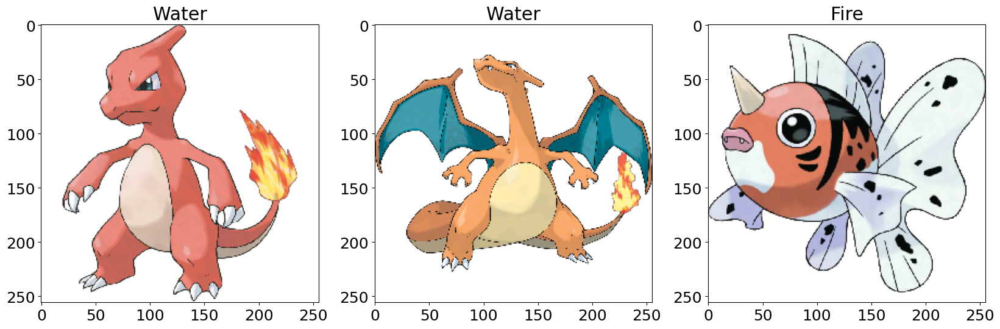

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

In [45]:
from PIL import Image
show_wrong_classification(y_test, predict_frame['category'], result)

  0%|          | 0/2 [00:00<?, ?it/s]/home/alv/.local/lib/python3.8/site-packages/seaborn/distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

/home/alv/.local/lib/python3.8/site-packages/seaborn/distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

/home/alv/.local/lib/python3.8/site-packages/seaborn/distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histogra

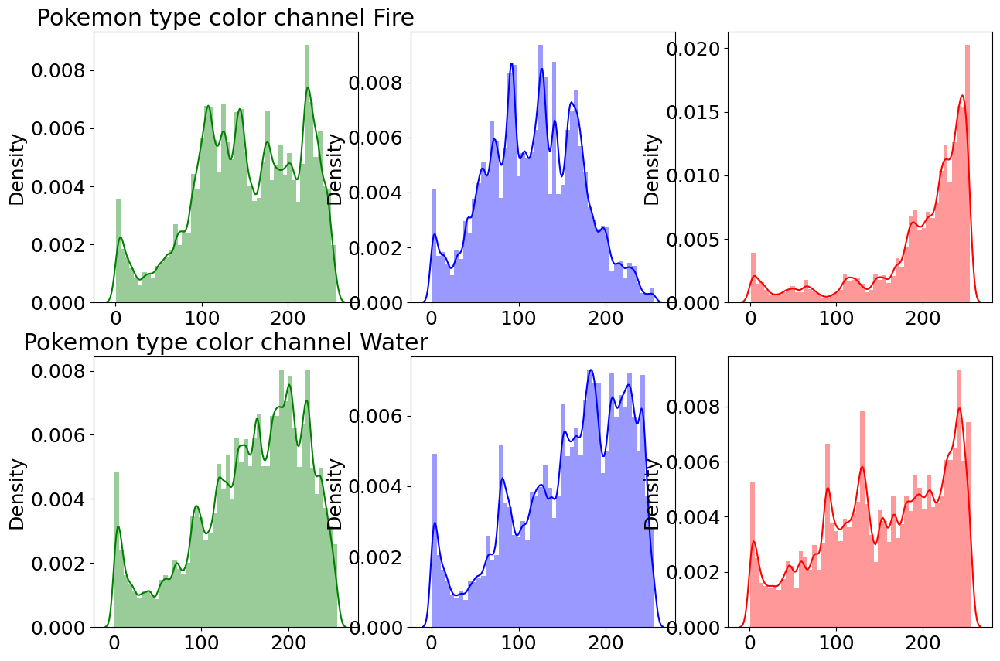

In [46]:
import seaborn as sns
import matplotlib.pyplot as plt

fig, axes = plt.subplots(2,3,figsize=(15,10))
k =0
import cv2
list_b =[]
list_r = []
list_g = []
from tqdm import tqdm
for type_ in tqdm(result['Type1'].unique()):
    tmp = result[result['Type1']==type_]
    for img in tmp['images']:
        img = cv2.imread(img)
        b, g, r = cv2.split(img)
        color = 'blue'
        for i in b:
            for j in i:
                if j != 0:
                    list_b.append(j)
        color = 'green'
        for i in g:
            for j in i:
                if j != 0:
                    list_g.append(j)
        color = 'red'
        for i in r:
            for j in i:
                if j != 0:
                    list_r.append(j)
    sns.distplot(list_g, ax=axes[k, 0], color='g')
    sns.distplot(list_b, ax=axes[k, 1], color='b')
    sns.distplot(list_r, ax=axes[k, 2], color='r')
    axes[k, 0].set_title('Pokemon type color channel ' + type_)
    if type_ =='Fire':
        list_g_f = list_g
        list_b_f = list_b
        list_r_f = list_r
    else:
        list_g_w = list_g
        list_b_w = list_b
        list_r_w = list_r
    list_b =[]
    list_r = []
    list_g = []
    
    k += 1

In [47]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

g_fire = np.std(np.array(list_g_f), axis=0)
r_fire = np.std(np.array(list_r_f), axis=0)
b_fire = np.std(np.array(list_b_f), axis=0)


g_water = np.std(np.array(list_g_w), axis=0)
r_water = np.std(np.array(list_r_w), axis=0)
b_water = np.std(np.array(list_b_w), axis=0)

fig = make_subplots(rows=1, cols=2, subplot_titles=("Fire std channel","Water std channel"))
fig.add_trace(go.Scatter(
    y=[b_fire, g_fire, g_fire],
    x=['blue', 'green', 'red'],
    mode='markers',
    marker=dict(size=[b_fire, g_fire, r_fire],
                color=['blue', 'green', 'red'],
                showscale=True)
), row=1, col=1)

fig.add_trace(go.Scatter(
    y=[b_water, g_water, r_water],
    x=['blue', 'green', 'red'],
    mode='markers',
    marker=dict(size=[b_water, g_water, r_water],
                color=['blue', 'green', 'red'],
                showscale=True)
), row=1, col=2)
fig.update_layout(showlegend=False)
fig.update_layout({
        'plot_bgcolor': 'rgba(0, 0, 0, 0)',
        'paper_bgcolor': 'rgba(0, 0, 0, 0)',
        'width': 850, 
        'height': 400

})
fig.show()

In [48]:
water = result[result['Type1']=='Water']
stds = []
values = []
for image in water['images']:
    img = cv2.imread(image)
    b, g, r = cv2.split(img)
    for i in r:
        for j in i:
            if j != 0:
                stds.append(j)       
    std = np.mean(np.array(stds), axis=0)
    values.append(std)
    stds = []
water['stds'] = values

<ipython-input-48-dce06db9b4c7>:14: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [49]:
water = water.sort_values(by='stds', ascending=False)

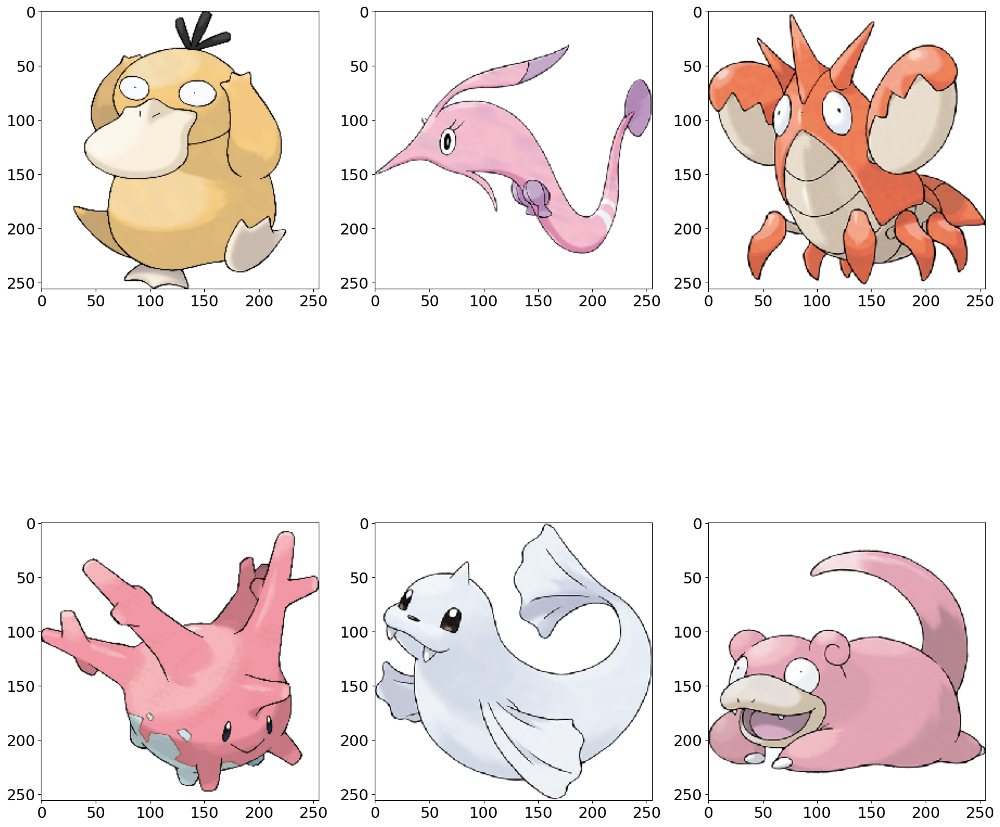

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

In [50]:
i = 0
j = 0
fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(20, 20))
for imag in water['images']:
    if i == 1 and j ==3:
        break
    if j > 2:
        i =1
        j = 0
    img = Image.open(imag)
    fig = plt.figure()
    ax[i][j].imshow(img)
    j+=1

<ipython-input-51-c45cc483509a>:14: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



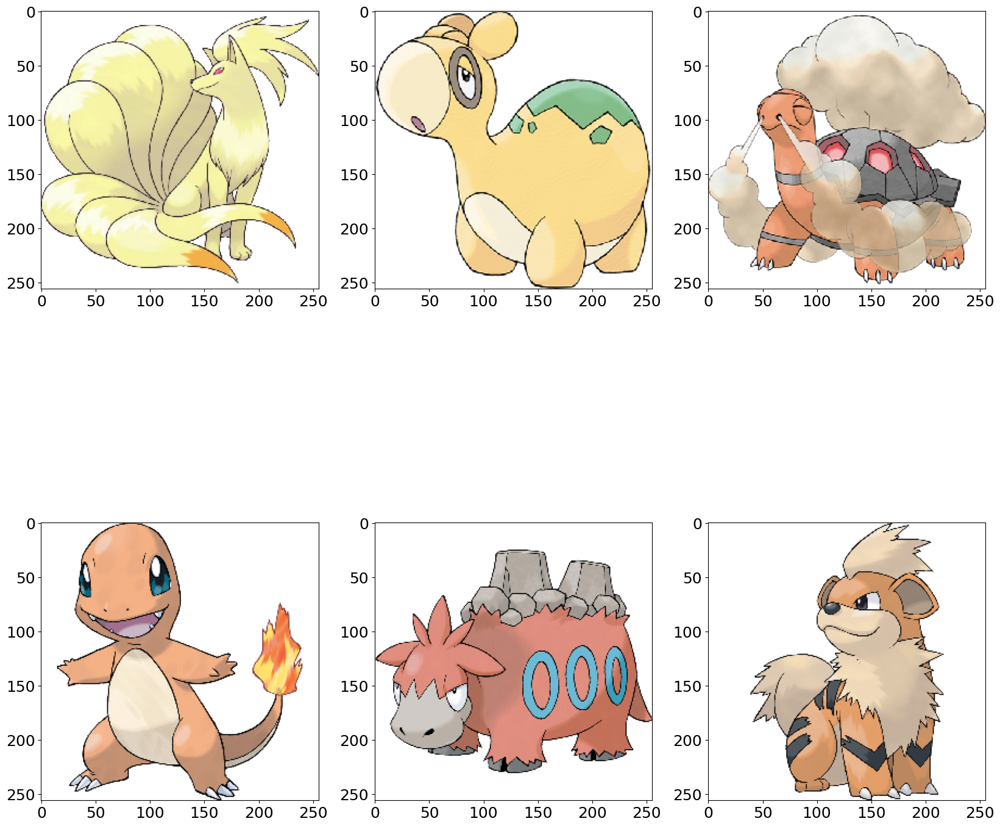

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

In [51]:
fire = result[result['Type1']=='Fire']
stds = []
values = []
for image in fire['images']:
    img = cv2.imread(image)
    b, g, r = cv2.split(img)
    for i in b:
        for j in i:
            if j != 0:
                stds.append(j)       
    std = np.mean(np.array(stds), axis=0)
    values.append(std)
    stds = []
fire['stds'] = values
fire = fire.sort_values(by='stds', ascending=False)
i = 0
j = 0
fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(20, 20))
for imag in fire['images']:
    if i == 1 and j ==3:
        break
    if j > 2:
        i =1
        j = 0
    img = Image.open(imag)
    fig = plt.figure()
    ax[i][j].imshow(img)
    j+=1

## Aumento de datos

    Para intentar mejorar nuestro resultado, aplicaré algo de aumento de imagen.

* brillo



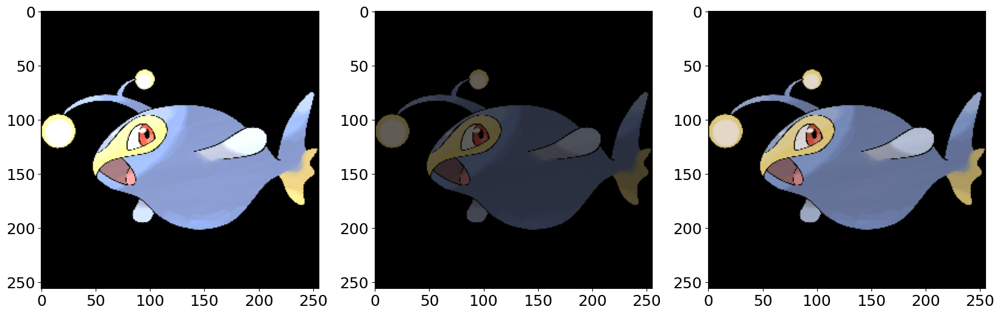

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

In [52]:
# example of horizontal shift image augmentation
from numpy import expand_dims
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
from keras.preprocessing.image import ImageDataGenerator
from matplotlib import pyplot
img = load_img(water['images'][170])
data = img_to_array(img)
samples = expand_dims(data, 0)
datagen = ImageDataGenerator(brightness_range=[0.2,1.5])
it = datagen.flow(samples, batch_size=1)
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(20, 20))
for i in range(3):
    fig = plt.figure()
    batch = it.next()
    image = batch[0].astype('uint8')
    ax[i].imshow(image)
pyplot.show()

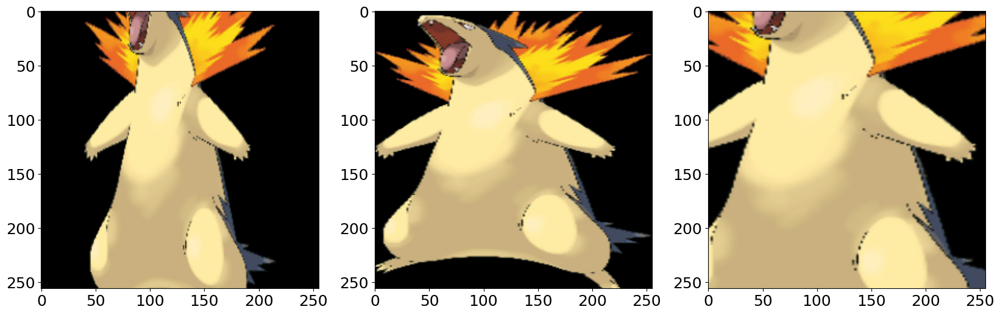

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

In [53]:
# Zoom
img = load_img(fire['images'][156])
data = img_to_array(img)
samples = expand_dims(data, 0)
datagen = ImageDataGenerator(zoom_range=[0.5, 1.0])
it = datagen.flow(samples, batch_size=1)
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(20, 20))
for i in range(3):
    fig = plt.figure()
    batch = it.next()
    image = batch[0].astype('uint8')
    ax[i].imshow(image)
pyplot.show()

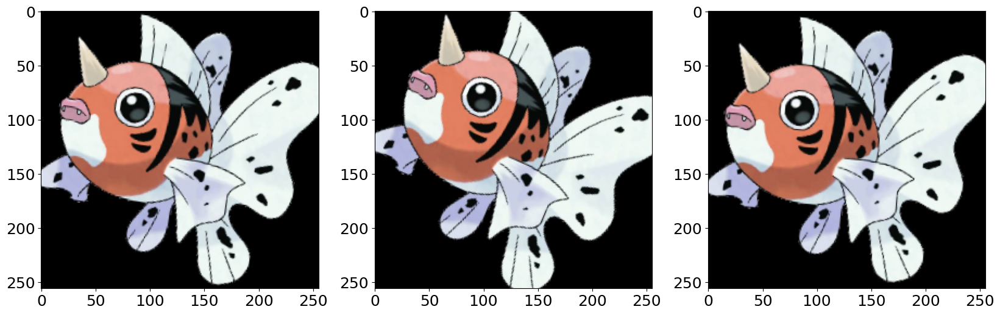

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

In [54]:
# Rotacion
img = load_img(water['images'][118])
data = img_to_array(img)
samples = expand_dims(data, 0)
datagen = ImageDataGenerator(rotation_range=35)
it = datagen.flow(samples, batch_size=1)
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(20, 20))
for i in range(3):
    fig = plt.figure()
    batch = it.next()
    image = batch[0].astype('uint8')
    ax[i].imshow(image)
pyplot.show()

In [55]:
datagentrain = ImageDataGenerator(rotation_range=35, 
                                 zoom_range=[0.5, 1.0], 
                                 brightness_range=[0.2,1.5])

datagen = ImageDataGenerator()

# train = datagentrain.flow_from_directory('train/')
# test = datagen.flow_from_directory('test/')
# val = datagen.flow_from_directory('val/')
train = datagen.flow_from_directory('pokemon2/train/')
test = datagen.flow_from_directory('pokemon2/test/')
val = datagen.flow_from_directory('pokemon2/val/')

Found 75 images belonging to 2 classes.
Found 24 images belonging to 2 classes.
Found 13 images belonging to 2 classes.


In [56]:
model = build()
history = model.fit_generator(train, epochs=30, validation_data=val)

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lambda_1 (Lambda)            (None, 256, 256, 3)       0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 255, 255, 32)      416       
_________________________________________________________________
batch_normalization_4 (Batch (None, 255, 255, 32)      128       
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 85, 85, 32)        0         
_________________________________________________________________
dropout_4 (Dropout)          (None, 85, 85, 32)        0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 84, 84, 64)        8256      
_________________________________________________________________
batch_normalization_5 (Batch (None, 84, 84, 64)       

In [57]:
fig = go.Figure()
epochs = []
for i in range(len(history.history['acc'])):
    epochs.append(i)
fig.add_trace(go.Scatter(x=epochs,y=history.history['acc'], mode='lines',name='train'))
fig.add_trace(go.Scatter(x=epochs,y=history.history['val_acc'], mode='lines',name='val'))
fig.update_layout({
        'plot_bgcolor': 'rgba(0, 0, 0, 0)',
        'paper_bgcolor': 'rgba(0, 0, 0, 0)',
        'width': 500, 
        'height': 400

})
fig.show()

In [58]:
predict_frame = pd.DataFrame([])
predict = model.predict_generator(test)
predict_frame['category'] = np.argmax(predict, axis=-1)
labels = dict((v,k) for k,v in val.class_indices.items())
predict_frame['category'] = predict_frame['category'].replace(labels)
print(classification_report(y_test, predict_frame['category']))

              precision    recall  f1-score   support

        Fire       0.44      0.67      0.53         6
       Water       0.87      0.72      0.79        18

    accuracy                           0.71        24
   macro avg       0.66      0.69      0.66        24
weighted avg       0.76      0.71      0.72        24



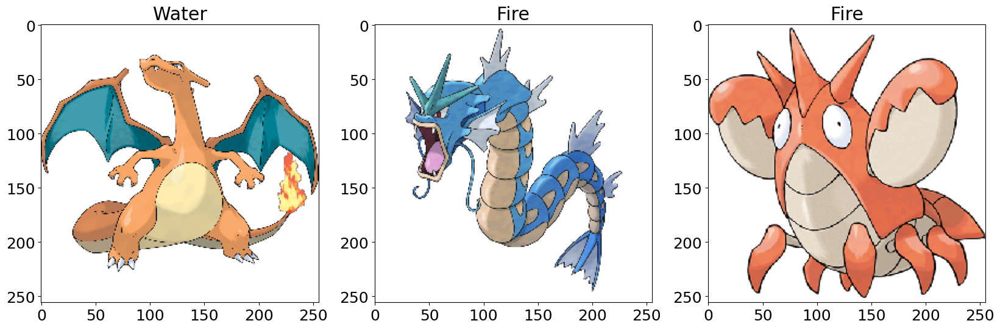

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

In [59]:
show_wrong_classification(y_test, predict_frame['category'], result)

Por lo tanto, una clasificación de los Pokémon de tipo fuego se ve afectada debido a que el canal rojo de los Pokémon de tipo agua es muy difícil de realizar la clasificación correctamente incluso con el aumento.